In [1]:
import numpy as np
import pandas as pd
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [30]:
stations = pd.DataFrame([])

for pref_cd in [11, 12, 13, 14]:
    file = f'../../../data/stats/stations_{pref_cd}.csv'
    pref_stations = pd.read_csv(file)
    stations = pd.concat([stations, pref_stations])
    
stations =  stations.drop('Unnamed: 0', axis=1)
stations.head(10)

,station_cd,station_g_cd,station_name,station_name_k,station_name_r,line_cd,pref_cd,post,address,lon,...,street_segments_count,node_density_km,intersection_density_km,edge_density_km,street_density_km,circuity_avg,self_loop_proportion,clean_intersection_count,clean_intersection_density_km,station_name_roman
0,1130506,1130506,東所沢,NaN,NaN,11305,11,359-0022,所沢市本郷１丁目,139.513878,...,706.0,210.635144,200.261250,44092.478846,22317.256266,1.033771,0.002147,366.0,165.080220,NaN
1,1130507,1130507,新座,NaN,NaN,11305,11,352-0011,新座市野火止５丁目,139.556328,...,672.0,212.306961,176.365231,36061.846385,18873.557190,1.096247,0.003834,277.0,115.765803,NaN
2,1130508,1130508,北朝霞,NaN,NaN,11305,11,351-0033,朝霞市浜崎１丁目,139.587322,...,879.0,247.449356,220.936925,43252.257861,22209.618128,1.058486,0.001174,335.0,134.570673,NaN
3,1130509,1130509,西浦和,NaN,NaN,11305,11,338-0837,さいたま市桜区田島５丁目,139.627707,...,872.0,278.826632,220.477262,41545.071412,21726.569992,1.042005,0.000000,301.0,125.451145,NaN
4,1130510,1130510,武蔵浦和,NaN,NaN,11305,11,336-0021,さいたま市南区別所七丁目12-1,139.647974,...,999.0,272.668926,246.320245,45257.298857,23983.223340,1.010927,0.000000,418.0,166.874979,NaN
5,1130511,1130511,南浦和,NaN,NaN,11305,11,336-0017,さいたま市南区南浦和２丁目,139.669125,...,1119.0,300.098040,272.599017,52039.970076,26763.337448,1.015478,0.000458,510.0,203.253653,NaN
6,1130512,1130512,東浦和,NaN,NaN,11305,11,336-0922,さいたま市緑区大牧,139.704627,...,816.0,250.371188,241.132398,47999.863277,24374.961347,1.047661,0.001238,372.0,171.841479,NaN
7,1130513,1130513,東川口,NaN,NaN,11305,11,333-0811,川口市戸塚１丁目,139.744087,...,753.0,204.376504,199.350852,46053.098294,23193.649554,1.021008,0.000000,421.0,176.316615,NaN
8,1130514,1130514,南越谷,NaN,NaN,11305,11,343-0845,越谷市南越谷１丁目,139.790499,...,756.0,207.587166,200.997097,40172.074327,20968.856572,1.020021,0.000000,328.0,135.096409,NaN
9,1130525,1130525,越谷レイクタウン,NaN,NaN,11305,11,343-0825,越谷市大成町５丁目,139.822178,...,372.0,105.371597,100.678935,25587.629027,15336.780550,1.060357,0.003091,192.0,81.908286,NaN


In [31]:
# 欠損している駅を除く
stations = stations[stations['station_cd'] != 1130407]

In [79]:
stations.to_csv('./stations_kanto.csv', index=False)

In [33]:
X_columns = ['n', 'm', 'k_avg', 'intersection_count',
       'streets_per_node_avg', 'edge_length_total', 'edge_length_avg',
       'street_length_total', 'street_length_avg', 'street_segments_count',
       'node_density_km', 'intersection_density_km', 'edge_density_km',
       'street_density_km', 'circuity_avg', 'self_loop_proportion',
       'clean_intersection_count', 'clean_intersection_density_km']

stations[X_columns].head(10)

,n,m,k_avg,intersection_count,streets_per_node_avg,edge_length_total,edge_length_avg,street_length_total,street_length_avg,street_segments_count,node_density_km,intersection_density_km,edge_density_km,street_density_km,circuity_avg,self_loop_proportion,clean_intersection_count,clean_intersection_density_km
0,467.0,1397.0,5.982869,444.0,3.137045,97757.607,69.976812,49479.676,70.084527,706.0,210.635144,200.261250,44092.478846,22317.256266,1.033771,0.002147,366.0,165.080220
1,508.0,1304.0,5.133858,422.0,2.759843,86287.411,66.171327,45159.928,67.202274,672.0,212.306961,176.365231,36061.846385,18873.557190,1.096247,0.003834,277.0,115.765803
2,616.0,1703.0,5.529221,550.0,2.975649,107672.096,63.224954,55288.585,62.899414,879.0,247.449356,220.936925,43252.257861,22209.618128,1.058486,0.001174,335.0,134.570673
3,669.0,1709.0,5.109118,529.0,2.727952,99680.768,58.326956,52129.437,59.781464,872.0,278.826632,220.477262,41545.071412,21726.569992,1.042005,0.000000,301.0,125.451145
4,683.0,1896.0,5.551977,617.0,3.071742,113363.615,59.790936,60074.838,60.134973,999.0,272.668926,246.320245,45257.298857,23983.223340,1.010927,0.000000,418.0,166.874979
5,753.0,2183.0,5.798141,684.0,3.110226,130577.652,59.815690,67154.031,60.012539,1119.0,300.098040,272.599017,52039.970076,26763.337448,1.015478,0.000458,510.0,203.253653
6,542.0,1615.0,5.959410,522.0,3.143911,103909.424,64.340201,52766.571,64.664915,816.0,250.371188,241.132398,47999.863277,24374.961347,1.047661,0.001238,372.0,171.841479
7,488.0,1496.0,6.131148,476.0,3.260246,109963.286,73.504870,55380.637,73.546663,753.0,204.376504,199.350852,46053.098294,23193.649554,1.021008,0.000000,421.0,176.316615
8,504.0,1448.0,5.746032,488.0,3.168651,97533.609,67.357465,50910.198,67.341532,756.0,207.587166,200.997097,40172.074327,20968.856572,1.020021,0.000000,328.0,135.096409
9,247.0,647.0,5.238866,236.0,3.226721,59979.582,92.704145,35950.720,96.641720,372.0,105.371597,100.678935,25587.629027,15336.780550,1.060357,0.003091,192.0,81.908286


In [32]:
len(stations)

2031

In [39]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# データ分割
X = stations[X_columns]
X_train = X

#標準化
sc = StandardScaler()
sc.fit(X)
X_std = sc.transform(X)

#主成分分析
pca = PCA(n_components=3)
pca.fit(X_std[40:45])
X_pca = pca.transform(X_std)

print('主成分分析前のデータ次元：{}'.format(X.shape))
print('主成分分析後のデータ次元：{}'.format(X_pca.shape))

#グラフ化
merge_data = pd.concat([pd.DataFrame(X_pca[:,0]), pd.DataFrame(X_pca[:,1]),  pd.DataFrame(X_pca[:,2])], axis=1)
merge_data.columns = ['pc1','pc2', 'pc3']

主成分分析前のデータ次元：(2031, 18)
主成分分析後のデータ次元：(2031, 3)


In [40]:
merge_data.head(10)

,pc1,pc2,pc3
0,-0.932476,0.728841,0.275738
1,-1.186589,-0.635504,2.465239
2,0.137028,-0.274607,0.752930
3,0.468508,-1.378730,1.508120
4,0.902938,-0.362098,0.057987
5,2.047157,0.335212,-0.537604
6,-0.039878,0.508106,-0.100209
7,-0.600714,0.821456,-0.665021
8,-0.983722,-0.096312,0.150206
9,-4.524158,-0.560691,1.452008


In [41]:
merge_data.to_csv('./kanto_stations_pca.csv', index=False)

In [43]:
# 寄与率
# モデルpcaの寄与率を算出
ev_ratio = pca.explained_variance_ratio_

# 寄与率をデータフレームに変換
df_evr = pd.DataFrame(data = ev_ratio, 
                      columns = ['寄与率'],
                      index = ["主成分{}".format(x+1) for x in range(len(merge_data.columns))])

df_evr

,寄与率
主成分1,0.788199
主成分2,0.132368
主成分3,0.066813


/opt/conda/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 20027 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/conda/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 25104 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/conda/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 20998 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/conda/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 32047 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/conda/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 31309 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/opt/conda/lib/python3.9/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 23492 missing from current font.
  font.set_

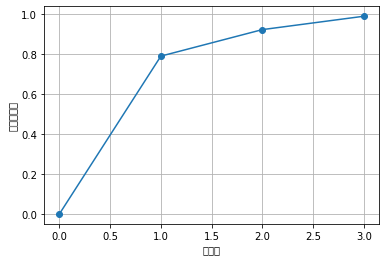

In [48]:
# 寄与率を累積する
cc_ratio = np.cumsum(ev_ratio)

# 0を連結
cc_ratio = np.hstack([0, cc_ratio])

# グラフを描画
plt.plot(cc_ratio, "-o")
plt.xlabel("主成分")
plt.ylabel("累積寄与率")
plt.grid()
plt.show()

In [50]:
# ⑹ 主成分を解釈する
# 主成分の分散を算出
eigen_value = pca.explained_variance_
pd.DataFrame(eigen_value, 
             columns = ["分散"], 
             index = ["主成分{}".format(x+1) for x in range(len(merge_data.columns))])

,分散
主成分1,1.525887
主成分2,0.256254
主成分3,0.129345


In [81]:
# 分散の大きさが寄与率を反映していることがわかります。第1主成分の分散は、他の主成分に対して圧倒的に大きく、その分情報量もたくさん持っています。

# 主成分負荷量を算出
eigen_vector = pca.components_
# データフレームに変換
component_load = pd.DataFrame(eigen_vector,
             columns = [X.columns],
             index = ["主成分{}".format(x+1) for x in range(len(merge_data.columns))])

In [44]:
# 基底ベクトルの値
pca.components_

array([[ 0.32492426,  0.36815647,  0.01012626,  0.26918656, -0.35298505,
         0.3355044 , -0.12190757,  0.21349904, -0.12849896,  0.27737386,
         0.29845242,  0.23473454,  0.2874772 ,  0.14793145, -0.01484514,
        -0.07384962,  0.16913555,  0.11084188],
       [-0.05789986,  0.08999151,  0.80691052, -0.01619072,  0.07080935,
         0.23411427,  0.04163904, -0.0251506 ,  0.01875485, -0.05002204,
        -0.13479213, -0.09305572,  0.13072717, -0.16538253,  0.03735236,
         0.41074191,  0.16158699,  0.06822692],
       [ 0.0405565 , -0.0028682 , -0.15976948,  0.10982103, -0.61852943,
        -0.13064772, -0.13071266, -0.23358011, -0.14974614, -0.05295161,
        -0.05064367,  0.01896714, -0.32810968, -0.44200956,  0.06159221,
         0.37808267,  0.10299257, -0.03063908]])

In [82]:
component_load.to_csv('./component_load.csv', index=False)

In [45]:
merge_data = pd.read_csv('./kanto_stations_pca.csv')

In [54]:
# k-means法を使うためのインポート
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# データの列の絞り込み
pc = merge_data[['pc1','pc2', 'pc3']]

# 標準化
sc = StandardScaler()
sc.fit(pc)
pc_std = sc.transform(pc)

0    1359
1     672
Name: cluster_number, dtype: int64


Text(0, 0.5, 'count')

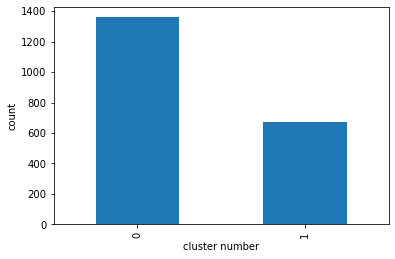

In [83]:
# KMeansクラスの初期化
kmeans = KMeans(init='random', n_clusters=2, random_state=0)

# クラスターの重心を計算
kmeans.fit(pc_std)

# クラスター番号をpandasのSeriesオブジェクトに変換
labels = pd.Series(kmeans.labels_, name='cluster_number', index=stations.index)

# クラスター番号と件数を表示
print(labels.value_counts(sort=False))

# グラフを描画
ax = labels.value_counts(sort=False).plot(kind='bar')
ax.set_xlabel('cluster number')
ax.set_ylabel('count')

In [84]:
# 駅のデータにクラスター番号のデータを結合
stations_with_cluster = pd.concat([stations, pd.Series(labels, index=stations.index)], axis=1)

# 先頭の5行を表示
stations_with_cluster.head()

,station_cd,station_g_cd,station_name,station_name_k,station_name_r,line_cd,pref_cd,post,address,lon,...,node_density_km,intersection_density_km,edge_density_km,street_density_km,circuity_avg,self_loop_proportion,clean_intersection_count,clean_intersection_density_km,station_name_roman,cluster_number
0,1130506,1130506,東所沢,NaN,NaN,11305,11,359-0022,所沢市本郷１丁目,139.513878,...,210.635144,200.261250,44092.478846,22317.256266,1.033771,0.002147,366.0,165.080220,NaN,0
1,1130507,1130507,新座,NaN,NaN,11305,11,352-0011,新座市野火止５丁目,139.556328,...,212.306961,176.365231,36061.846385,18873.557190,1.096247,0.003834,277.0,115.765803,NaN,1
2,1130508,1130508,北朝霞,NaN,NaN,11305,11,351-0033,朝霞市浜崎１丁目,139.587322,...,247.449356,220.936925,43252.257861,22209.618128,1.058486,0.001174,335.0,134.570673,NaN,0
3,1130509,1130509,西浦和,NaN,NaN,11305,11,338-0837,さいたま市桜区田島５丁目,139.627707,...,278.826632,220.477262,41545.071412,21726.569992,1.042005,0.000000,301.0,125.451145,NaN,0
4,1130510,1130510,武蔵浦和,NaN,NaN,11305,11,336-0021,さいたま市南区別所七丁目12-1,139.647974,...,272.668926,246.320245,45257.298857,23983.223340,1.010927,0.000000,418.0,166.874979,NaN,0


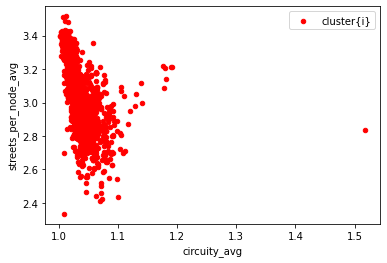

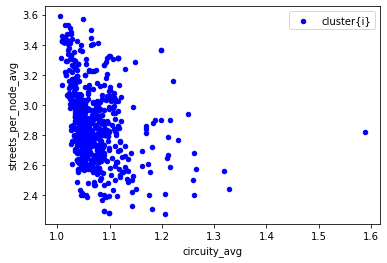

In [85]:
stations_0 = stations_with_cluster[stations_with_cluster['cluster_number'] == 0]
stations_1 = stations_with_cluster[stations_with_cluster['cluster_number'] == 1]

# クラスタリング結果のグラフ化
ax = None
colors = ['red', 'blue']
for i, station in stations_with_cluster.groupby('cluster_number'):
    station.plot.scatter(x='circuity_avg', y='streets_per_node_avg', color=colors[i], label='cluster{i}', ax=ax)

In [87]:
stations_with_cluster.to_csv('./stations_with_cluster_2.csv')

In [86]:
import folium
center_lat, center_lon = (35.651820534474,139.54461236426)

_map = folium.Map(location=[center_lat, center_lon], zoom_start=11)

for _, station in stations_with_cluster.iterrows():
    color = 'pink' if station['cluster_number'] == 0 else 'blue' if station['cluster_number'] == 1 else 'red' if station['cluster_number'] == 2 else 'green' if station['cluster_number'] == 3 else 'orange'
    folium.Marker([station.lat, station.lon], popup=str(station['station_name_roman']), icon=folium.Icon(color=color)).add_to(_map)

_map

0     582
1     320
2    1129
Name: cluster_number, dtype: int64


Text(0, 0.5, 'count')

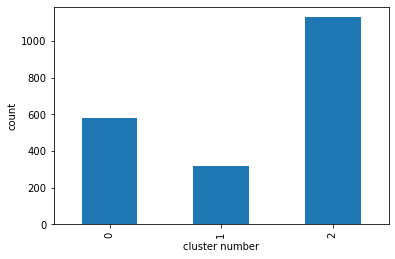

In [55]:
# KMeansクラスの初期化
kmeans = KMeans(init='random', n_clusters=3, random_state=0)

# クラスターの重心を計算
kmeans.fit(pc_std)

# クラスター番号をpandasのSeriesオブジェクトに変換
labels = pd.Series(kmeans.labels_, name='cluster_number', index=stations.index)

# クラスター番号と件数を表示
print(labels.value_counts(sort=False))

# グラフを描画
ax = labels.value_counts(sort=False).plot(kind='bar')
ax.set_xlabel('cluster number')
ax.set_ylabel('count')

In [56]:
# 駅のデータにクラスター番号のデータを結合
stations_with_cluster = pd.concat([stations, pd.Series(labels, index=stations.index)], axis=1)

# 先頭の5行を表示
stations_with_cluster.head()

,station_cd,station_g_cd,station_name,station_name_k,station_name_r,line_cd,pref_cd,post,address,lon,...,node_density_km,intersection_density_km,edge_density_km,street_density_km,circuity_avg,self_loop_proportion,clean_intersection_count,clean_intersection_density_km,station_name_roman,cluster_number
0,1130506,1130506,東所沢,NaN,NaN,11305,11,359-0022,所沢市本郷１丁目,139.513878,...,210.635144,200.261250,44092.478846,22317.256266,1.033771,0.002147,366.0,165.080220,NaN,2
1,1130507,1130507,新座,NaN,NaN,11305,11,352-0011,新座市野火止５丁目,139.556328,...,212.306961,176.365231,36061.846385,18873.557190,1.096247,0.003834,277.0,115.765803,NaN,0
2,1130508,1130508,北朝霞,NaN,NaN,11305,11,351-0033,朝霞市浜崎１丁目,139.587322,...,247.449356,220.936925,43252.257861,22209.618128,1.058486,0.001174,335.0,134.570673,NaN,2
3,1130509,1130509,西浦和,NaN,NaN,11305,11,338-0837,さいたま市桜区田島５丁目,139.627707,...,278.826632,220.477262,41545.071412,21726.569992,1.042005,0.000000,301.0,125.451145,NaN,2
4,1130510,1130510,武蔵浦和,NaN,NaN,11305,11,336-0021,さいたま市南区別所七丁目12-1,139.647974,...,272.668926,246.320245,45257.298857,23983.223340,1.010927,0.000000,418.0,166.874979,NaN,2


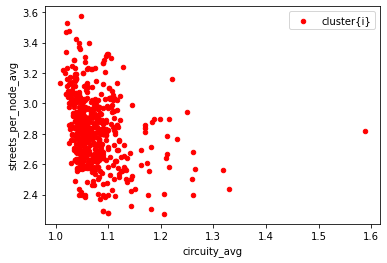

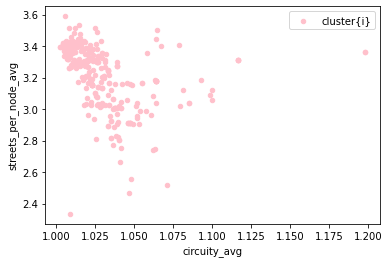

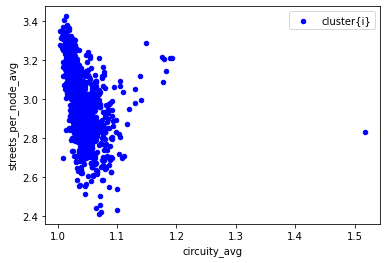

In [57]:
stations_0 = stations_with_cluster[stations_with_cluster['cluster_number'] == 0]
stations_1 = stations_with_cluster[stations_with_cluster['cluster_number'] == 1]
stations_2 = stations_with_cluster[stations_with_cluster['cluster_number'] == 2]
# クラスタリング結果のグラフ化
ax = None
colors = ['red', 'pink', 'blue']
for i, station in stations_with_cluster.groupby('cluster_number'):
    station.plot.scatter(x='circuity_avg', y='streets_per_node_avg', color=colors[i], label='cluster{i}', ax=ax)

In [61]:
import folium
center_lat, center_lon = (35.651820534474,139.54461236426)

_map = folium.Map(location=[center_lat, center_lon], zoom_start=11)

for _, station in stations_with_cluster.iterrows():
    color = 'pink' if station['cluster_number'] == 0 else 'blue' if station['cluster_number'] == 1 else 'red' if station['cluster_number'] == 2 else 'green' if station['cluster_number'] == 3 else 'orange'
    folium.Marker([station.lat, station.lon], popup=str(station['station_name_roman']), icon=folium.Icon(color=color)).add_to(_map)

_map

0    315
1    621
2    332
3    763
Name: cluster_number, dtype: int64


Text(0, 0.5, 'count')

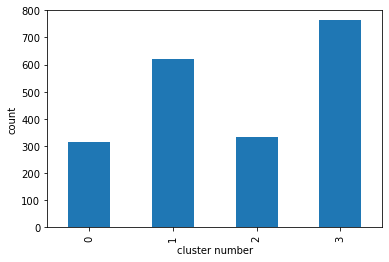

In [67]:
# KMeansクラスの初期化
kmeans = KMeans(init='random', n_clusters=4, random_state=0)

# クラスターの重心を計算
kmeans.fit(pc_std)

# クラスター番号をpandasのSeriesオブジェクトに変換
labels = pd.Series(kmeans.labels_, name='cluster_number', index=stations.index)

# クラスター番号と件数を表示
print(labels.value_counts(sort=False))

# グラフを描画
ax = labels.value_counts(sort=False).plot(kind='bar')
ax.set_xlabel('cluster number')
ax.set_ylabel('count')

In [68]:
# 駅のデータにクラスター番号のデータを結合
stations_with_cluster = pd.concat([stations, pd.Series(labels, index=stations.index)], axis=1)

# 先頭の5行を表示
stations_with_cluster.head()

,station_cd,station_g_cd,station_name,station_name_k,station_name_r,line_cd,pref_cd,post,address,lon,...,node_density_km,intersection_density_km,edge_density_km,street_density_km,circuity_avg,self_loop_proportion,clean_intersection_count,clean_intersection_density_km,station_name_roman,cluster_number
0,1130506,1130506,東所沢,NaN,NaN,11305,11,359-0022,所沢市本郷１丁目,139.513878,...,210.635144,200.261250,44092.478846,22317.256266,1.033771,0.002147,366.0,165.080220,NaN,1
1,1130507,1130507,新座,NaN,NaN,11305,11,352-0011,新座市野火止５丁目,139.556328,...,212.306961,176.365231,36061.846385,18873.557190,1.096247,0.003834,277.0,115.765803,NaN,3
2,1130508,1130508,北朝霞,NaN,NaN,11305,11,351-0033,朝霞市浜崎１丁目,139.587322,...,247.449356,220.936925,43252.257861,22209.618128,1.058486,0.001174,335.0,134.570673,NaN,3
3,1130509,1130509,西浦和,NaN,NaN,11305,11,338-0837,さいたま市桜区田島５丁目,139.627707,...,278.826632,220.477262,41545.071412,21726.569992,1.042005,0.000000,301.0,125.451145,NaN,3
4,1130510,1130510,武蔵浦和,NaN,NaN,11305,11,336-0021,さいたま市南区別所七丁目12-1,139.647974,...,272.668926,246.320245,45257.298857,23983.223340,1.010927,0.000000,418.0,166.874979,NaN,1


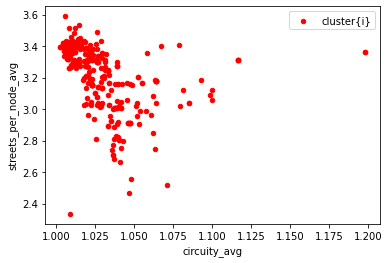

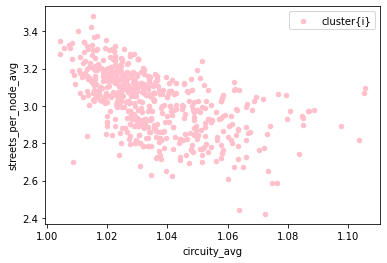

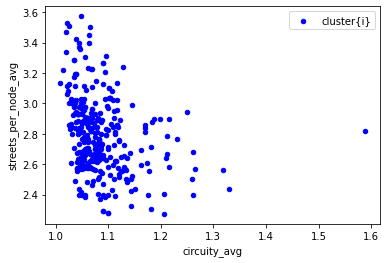

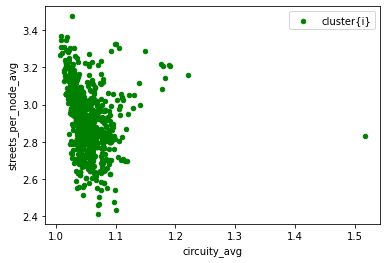

In [69]:
stations_0 = stations_with_cluster[stations_with_cluster['cluster_number'] == 0]
stations_1 = stations_with_cluster[stations_with_cluster['cluster_number'] == 1]
stations_2 = stations_with_cluster[stations_with_cluster['cluster_number'] == 2]
stations_3 = stations_with_cluster[stations_with_cluster['cluster_number'] == 3]
# クラスタリング結果のグラフ化
ax = None
colors = ['red', 'pink', 'blue', 'green']
for i, station in stations_with_cluster.groupby('cluster_number'):
    station.plot.scatter(x='circuity_avg', y='streets_per_node_avg', color=colors[i], label='cluster{i}', ax=ax)

In [70]:
import folium
center_lat, center_lon = (35.651820534474,139.54461236426)

_map = folium.Map(location=[center_lat, center_lon], zoom_start=11)

for _, station in stations_with_cluster.iterrows():
    color = 'pink' if station['cluster_number'] == 0 else 'blue' if station['cluster_number'] == 1 else 'red' if station['cluster_number'] == 2 else 'green' if station['cluster_number'] == 3 else 'orange'
    folium.Marker([station.lat, station.lon], popup=str(station['station_name_roman']), icon=folium.Icon(color=color)).add_to(_map)

_map

In [71]:
stations_with_cluster.to_csv('./stations_with_cluster_4.csv', index=False)

0    424
1    268
2    632
3    405
4    302
Name: cluster_number, dtype: int64


Text(0, 0.5, 'count')

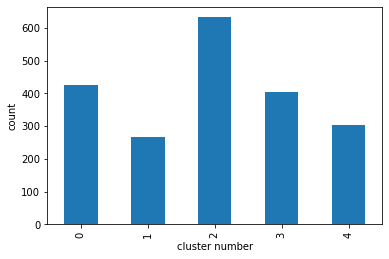

In [72]:
# KMeansクラスの初期化
kmeans = KMeans(init='random', n_clusters=5, random_state=0)

# クラスターの重心を計算
kmeans.fit(pc_std)

# クラスター番号をpandasのSeriesオブジェクトに変換
labels = pd.Series(kmeans.labels_, name='cluster_number', index=stations.index)

# クラスター番号と件数を表示
print(labels.value_counts(sort=False))

# グラフを描画
ax = labels.value_counts(sort=False).plot(kind='bar')
ax.set_xlabel('cluster number')
ax.set_ylabel('count')

In [73]:
# 駅のデータにクラスター番号のデータを結合
stations_with_cluster = pd.concat([stations, pd.Series(labels, index=stations.index)], axis=1)

# 先頭の5行を表示
stations_with_cluster.head()

,station_cd,station_g_cd,station_name,station_name_k,station_name_r,line_cd,pref_cd,post,address,lon,...,node_density_km,intersection_density_km,edge_density_km,street_density_km,circuity_avg,self_loop_proportion,clean_intersection_count,clean_intersection_density_km,station_name_roman,cluster_number
0,1130506,1130506,東所沢,NaN,NaN,11305,11,359-0022,所沢市本郷１丁目,139.513878,...,210.635144,200.261250,44092.478846,22317.256266,1.033771,0.002147,366.0,165.080220,NaN,0
1,1130507,1130507,新座,NaN,NaN,11305,11,352-0011,新座市野火止５丁目,139.556328,...,212.306961,176.365231,36061.846385,18873.557190,1.096247,0.003834,277.0,115.765803,NaN,2
2,1130508,1130508,北朝霞,NaN,NaN,11305,11,351-0033,朝霞市浜崎１丁目,139.587322,...,247.449356,220.936925,43252.257861,22209.618128,1.058486,0.001174,335.0,134.570673,NaN,0
3,1130509,1130509,西浦和,NaN,NaN,11305,11,338-0837,さいたま市桜区田島５丁目,139.627707,...,278.826632,220.477262,41545.071412,21726.569992,1.042005,0.000000,301.0,125.451145,NaN,2
4,1130510,1130510,武蔵浦和,NaN,NaN,11305,11,336-0021,さいたま市南区別所七丁目12-1,139.647974,...,272.668926,246.320245,45257.298857,23983.223340,1.010927,0.000000,418.0,166.874979,NaN,0


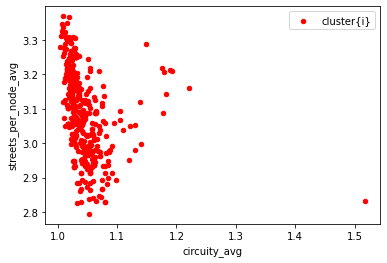

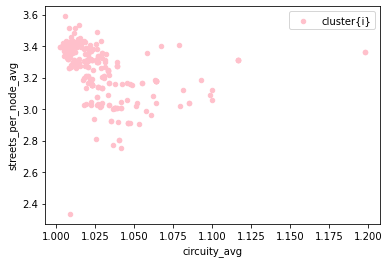

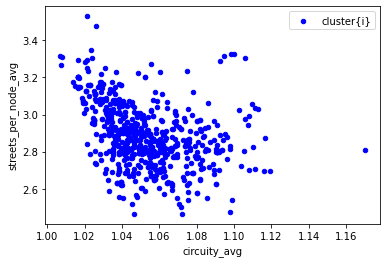

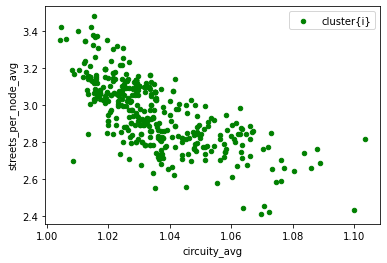

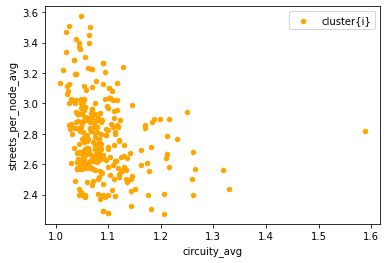

In [74]:
stations_0 = stations_with_cluster[stations_with_cluster['cluster_number'] == 0]
stations_1 = stations_with_cluster[stations_with_cluster['cluster_number'] == 1]
stations_2 = stations_with_cluster[stations_with_cluster['cluster_number'] == 2]
stations_3 = stations_with_cluster[stations_with_cluster['cluster_number'] == 3]
stations_4 = stations_with_cluster[stations_with_cluster['cluster_number'] == 4]
# クラスタリング結果のグラフ化
ax = None
colors = ['red', 'pink', 'blue', 'green', 'orange']
for i, station in stations_with_cluster.groupby('cluster_number'):
    station.plot.scatter(x='circuity_avg', y='streets_per_node_avg', color=colors[i], label='cluster{i}', ax=ax)

In [75]:
len(stations_2)

632

In [76]:
stations_with_cluster[['cluster_number']].value_counts()

cluster_number
2                 632
0                 424
3                 405
4                 302
1                 268
dtype: int64

In [77]:
stations_with_cluster.to_csv('./stations_with_cluster_5.csv')

In [78]:
import folium
center_lat, center_lon = (35.651820534474,139.54461236426)

_map = folium.Map(location=[center_lat, center_lon], zoom_start=9)

for _, station in stations_with_cluster.iterrows():
    color = 'pink' if station['cluster_number'] == 0 else 'blue' if station['cluster_number'] == 1 else 'red' if station['cluster_number'] == 2 else 'green' if station['cluster_number'] == 3 else 'orange'
    folium.Marker([station.lat, station.lon], popup=str(station['station_name_roman']), icon=folium.Icon(color=color)).add_to(_map)

_map